In [47]:
import os
os.environ["OMP_NUM_THREADS"] = "8" # export OMP_NUM_THREADS=4
os.environ["OPENBLAS_NUM_THREADS"] = "8" # export OPENBLAS_NUM_THREADS=4 
os.environ["MKL_NUM_THREADS"] = "8" # export MKL_NUM_THREADS=6
os.environ["VECLIB_MAXIMUM_THREADS"] = "8" # export VECLIB_MAXIMUM_THREADS=4
os.environ["NUMEXPR_NUM_THREADS"] = "8" # export NUMEXPR_NUM_THREADS=6

In [77]:
import umap
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import sklearn as sk
import plotly.express as px
import chart_studio
import matplotlib.pyplot as plt
import scipy as sp
import seaborn as sb
import pymde
from matplotlib import animation
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.patheffects as pe
from tqdm import tqdm
import matplotlib as mpl

import torch
torch.set_num_threads(8)

chart_studio.tools.set_credentials_file(username='_zsteve', api_key='lmTQan6YISERy6E3Lwwo')
SIZE_FACTOR = 25

In [78]:
df = pd.read_csv("../data/JS77_filtered_2_new_stages.txt", sep = ",");
fate_names =["cDC1", "cDC2", "pDC", "Eos", "Mon", "Neu", "B",]
stages = list(df.Stage.unique())[::-1]

In [79]:
# experimental
adata_exp = ad.AnnData(df.loc[:, df.columns.str.contains("n\.")], dtype = np.float64)
adata_exp.obs = df.loc[:, ~df.columns.str.contains("n\.")]
adata_exp = adata_exp[:, adata_exp.var.index != "n.T"] # drop T lineage
thresh = 5
adata_exp = adata_exp[adata_exp.X.sum(-1) >= thresh, :]
adata_exp.obs["stage"] = np.array([stages[np.where([x in y for y in stages])[0][0]] for x in adata_exp.obs.Stage])
# simulation (readout)
adata_all = [ad.AnnData(pd.read_csv("../data/clone_readout_%s.csv" % f, sep = ",").iloc[:, 0:8], dtype = np.float64) for f in stages]
for (i, f) in enumerate(stages):
    adata_all[i].obs["stage"] = f
adata = ad.concat(adata_all)
# simulation (trajectory)
# df_traj = pd.read_csv("../data/traj_all.csv")
# adata_traj = ad.AnnData(df_traj.iloc[:, 0:-2], obs = df_traj.loc[:, ["id", "t"]], dtype = np.float64)
# df_cloud = pd.read_csv("../data/traj_cloud_all.csv")
# adata_cloud = ad.AnnData(df_cloud.iloc[:, 0:-2], obs = df_cloud.loc[:, ["id", "t"]], dtype = np.float64)
# sc.pp.subsample(adata_cloud, n_obs = 10_000)

/data/gpfs/projects/punim0638/stephenz/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning:

Transforming to str index.

/data/gpfs/projects/punim0638/stephenz/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/tmp/ipykernel_49467/693492450.py:7: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.

/data/gpfs/projects/punim0638/stephenz/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning:

Transforming to str index.

/data/gpfs/projects/punim0638/stephenz/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning:

Transforming to str index.

/data/gpfs/projects/punim0638/stephenz/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:121:

Text(0, 0.5, 'Count')

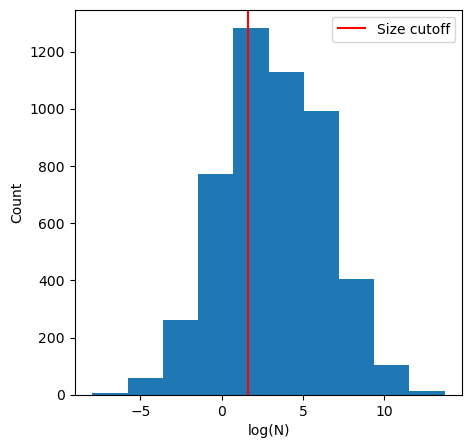

In [80]:
plt.figure(figsize = (5, 5))
plt.hist(np.log(df.loc[:, df.columns.str.contains("n\.")].sum(1)))
plt.axvline([np.log(thresh), ], c = "red", label = "Size cutoff")
plt.legend()
plt.xlabel("log(N)")
plt.ylabel("Count")

In [81]:
# relative entropy
ent = lambda a, b: -sp.special.xlogy(a, a/b).sum(-1)
cm = mpl.cm.get_cmap("tab10")
# cm = mpl.colors.ListedColormap(["#00f0ffff", "#00ff67ff", "#0028ffff", "#ff8600ff", "#ff0012ff", "#ff44d4ff", "#7761ff"])
# for a in [adata, adata_exp, adata_traj, adata_cloud]:
for a in [adata, adata_exp]:
    a.obsm["X_norm"] = (a.X.T / a.X.sum(1)).T
    a.obs["sizes"] = a.X.sum(-1)
    sc.pp.log1p(a)
    a.obs["sizes_log"] = a.X.sum(-1)
    a.obsm["X_norm_log"] = (a.X.T / a.X.sum(1)).T
    # entropy relative to uniform
    a.obs["ent"] = ent(a.obsm["X_norm_log"], np.ones(a.shape[1]))
    # log colors
    a.obsm["X_color_fraction"] = a.obsm["X_norm_log"]
    colors = np.array([np.array(cm(x)) for x in range(a.shape[1])])
    a.obsm["X_colors"] = a.obsm["X_color_fraction"] @ colors
    a.obsm["X_colors"] /= np.max(a.obsm["X_colors"], -1).reshape(-1, 1)
    sc.pp.pca(a)

/tmp/ipykernel_49467/380381082.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



In [82]:
perturb = lambda x, y: (x*y)/(x*y).sum()
perturb_inv = lambda x, y: perturb(x, (1/y)/(1/y).sum())
add_const = lambda x, c: (x + c)/(x + c).sum(-1).reshape(-1, 1)
## geometric mean
u = np.exp(np.log(add_const(adata.obsm["X_norm_log"], 0.05)).mean(0))
u_inv = (1/u) / (1/u).sum()
for a in [adata, adata_exp, adata_traj, adata_cloud]:
    a.obs["ent"] = ent(np.array([perturb_inv(x, u) for x in a.obsm["X_norm_log"]]), np.ones(a.shape[1]))

/data/gpfs/projects/punim0638/stephenz/miniconda3/lib/python3.10/site-packages/sklearn/manifold/_mds.py:298: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



Text(0.5, 0.98, 'Dissimilarity')

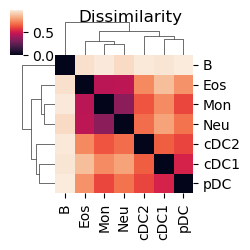

In [83]:
mds_op = sk.manifold.MDS(n_components = 3, dissimilarity = "precomputed", metric = True, n_init = 25, max_iter = 1000, random_state = 0)
# correlation simplex
C = (1 - pd.DataFrame(adata_exp.X).corr()**2)
v = mds_op.fit_transform(C)
y = adata.obsm["X_norm_log"] @ v
y_exp = adata_exp.obsm["X_norm_log"] @ v
y_traj = adata_traj.obsm["X_norm_log"] @ v
y_cloud = adata_cloud.obsm["X_norm_log"] @ v

# C = (1 - pd.DataFrame(adata_exp.X).corr()**2)/2 
sb.clustermap(pd.DataFrame(np.array(C), index = fate_names, columns = fate_names), figsize = (2.5, 2.5)).fig.suptitle("Dissimilarity")

In [84]:
# compute also the PCA decomposition
pca_op = sk.decomposition.PCA(n_components = 3)
y_pca = pca_op.fit_transform(y)
y_exp_pca = pca_op.transform(y_exp)
y_traj_pca = pca_op.transform(y_traj)
y_cloud_pca = pca_op.transform(y_cloud)

Text(0.5, 1.0, 'Simulated')

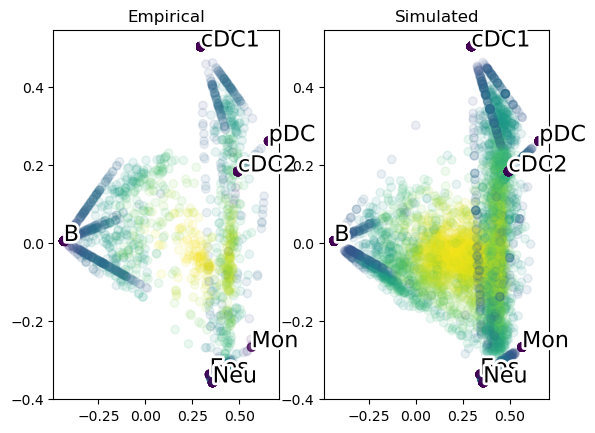

In [85]:
fate_pos_index = [adata.obsm["X_norm_log"][:, i] >= np.quantile(adata.obsm["X_norm_log"][:, i], 0.9999) for (i, n) in enumerate(fate_names)]
# empirical data
plt.subplot(1, 2, 1)
plt.scatter(y_exp_pca[:, 0], y_exp_pca[:, 1], alpha = 0.1, c = adata_exp.obs.ent)
for (i, n) in enumerate(fate_names):
    fpi = [adata_exp.obsm["X_norm_log"][:, i] >= np.quantile(adata_exp.obsm["X_norm_log"][:, i], 0.9999) for (i, n) in enumerate(fate_names)]
    _x, _y, _, = y_exp_pca[fpi[i]].mean(0)
    plt.text(*(np.array([_x, _y])), n, fontsize = 16, path_effects=[pe.withStroke(linewidth=4, foreground="white")])
plt.title("Empirical")

# simulated data
plt.subplot(1, 2, 2)
plt.scatter(y_pca[:, 0], y_pca[:, 1], alpha = 0.1, c = adata.obs.ent)
for (i, n) in enumerate(fate_names):
    _x, _y, _, = y_pca[fate_pos_index[i]].mean(0)
    plt.text(*(np.array([_x, _y])), n, fontsize = 16, path_effects=[pe.withStroke(linewidth=4, foreground="white")])
plt.title("Simulated")

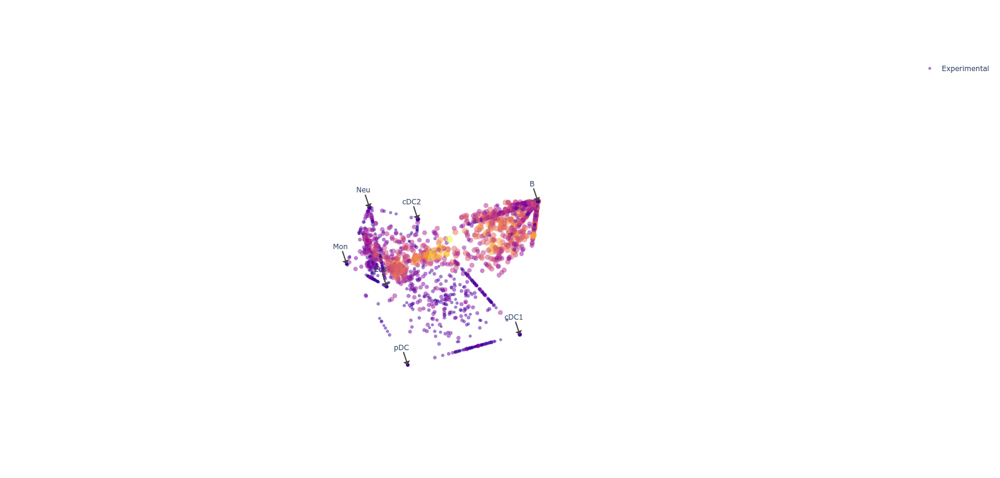

In [86]:
import plotly.graph_objects as go
fig = px.scatter_3d(x = y_exp_pca[:, 0], y = y_exp_pca[:, 1], z = y_exp_pca[:, 2], width = 800, height = 800, 
              hover_data = {k : adata_exp.obsm["X_norm"][:, i] for (i, k) in enumerate(fate_names)},
              size = np.log1p(adata_exp.obs.sizes), 
              opacity = 0.5)
fig.update_traces(marker = dict(color = np.log(adata_exp.obs.sizes), 
                                 line = dict(width = 0)), showlegend = True, name = "Experimental")

fate_pos_index = [adata.obsm["X_norm_log"][:, i] >= np.quantile(adata.obsm["X_norm_log"][:, i], 0.9999) for (i, n) in enumerate(fate_names)]
fate_pos = [y_pca[i].mean(0) for i in fate_pos_index]
ann = [dict(x = x[0], y = x[1], z = x[2], text = nl) for (x, nl) in zip(fate_pos, fate_names)]
fig = go.Figure(data = fig.data)
fig.update_layout(width = 800, height = 800, scene = dict(annotations = ann))
fig.update_scenes(xaxis_visible = False, yaxis_visible = False, zaxis_visible = False)

/tmp/ipykernel_49467/2088121866.py:7: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_49467/2088121866.py:7: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_49467/2088121866.py:7: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_49467/2088121866.py:7: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (c

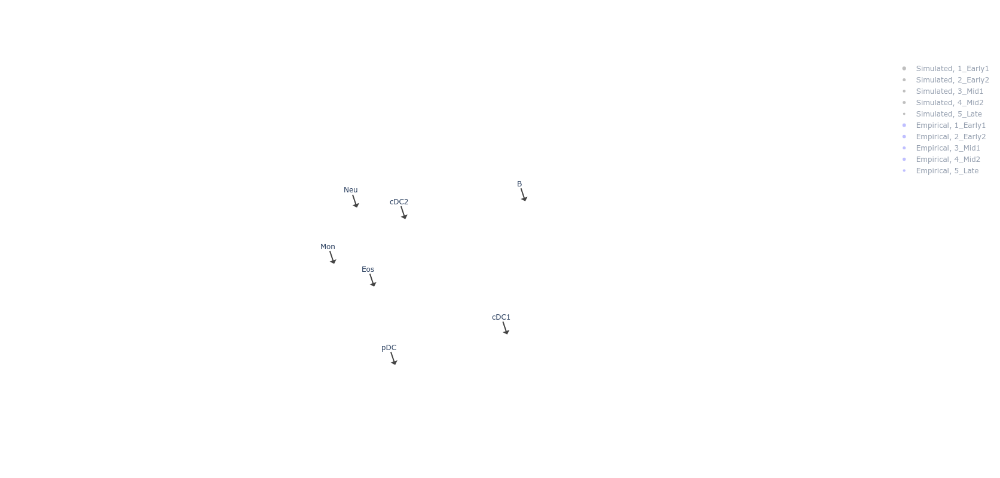

In [87]:
N_all = [(adata_exp.obs.stage == s).sum() for s in stages]
# Simulated data, by stage
plot_idx = {s : np.random.choice(np.where(adata.obs.stage == s)[0], N) for (N, s) in zip(N_all, stages)}
figs_sim = [px.scatter_3d(x = y_pca[plot_idx[s], 0], y = y_pca[plot_idx[s], 1], z = y_pca[plot_idx[s], 2], 
                          width = 800, height = 800, 
                          hover_data = {k : adata.obsm["X_norm"][plot_idx[s], i] for (i, k) in enumerate(fate_names)},
                          size = np.log1p(adata.obs.sizes[plot_idx[s]]), 
                          opacity = 0.5) for s in stages]
for (s, f) in zip(stages, figs_sim):
    f.update_traces(marker = dict(color = adata[plot_idx[s]].obsm["X_colors"], 
                                     line = dict(width = 0)), showlegend = True, name = "Simulated, %s" % s, visible = "legendonly")
# Empirical data, by stage
plot_idx = {s : np.random.choice(np.where(adata_exp.obs.stage == s)[0], N) for (N, s) in zip(N_all, stages)}
figs_exp = [px.scatter_3d(x = y_exp_pca[plot_idx[s], 0], y = y_exp_pca[plot_idx[s], 1], z = y_exp_pca[plot_idx[s], 2], 
                         width = 800, height = 800, 
                         hover_data = {k : adata_exp.obsm["X_norm"][plot_idx[s], i] for (i, k) in enumerate(fate_names)},
                         size = np.log1p(adata_exp.obs.sizes[plot_idx[s]]), 
                         opacity = 0.5) for s in stages]
for (s, f) in zip(stages, figs_exp):
    f.update_traces(marker = dict(color = "blue", 
                                     line = dict(width = 0)), showlegend = True, name = "Empirical, %s" % s, visible = "legendonly")
# Trajectories
# figs_traj = [px.scatter_3d(x = y_traj_pca[:, 0], y = y_traj_pca[:, 1], z = y_traj_pca[:, 2], 
#                          width = 800, height = 800, 
#                          hover_data = {k : adata_traj.obsm["X_norm"][:, i] for (i, k) in enumerate(fate_names)},
#                          size = np.log1p(adata_traj.obs.sizes), 
#                          opacity = 0.25), ]
# for f in figs_traj:
#     f.update_traces(marker = dict(color = adata_traj.obsm["X_colors"], line = dict(width = 0)), showlegend = True, name = "Trajectory", visible = "legendonly")

fig = go.Figure(data = figs_sim[0].data + figs_sim[1].data + figs_sim[2].data + figs_sim[3].data + figs_sim[4].data + \
                       figs_exp[0].data + figs_exp[1].data + figs_exp[2].data + figs_exp[3].data + figs_exp[4].data 
                       # figs_traj[0].data
               )
fig.update_layout(width = 800, height = 800, scene = dict(annotations = ann))
fig.update_scenes(xaxis_visible = False, yaxis_visible = False, zaxis_visible = False)

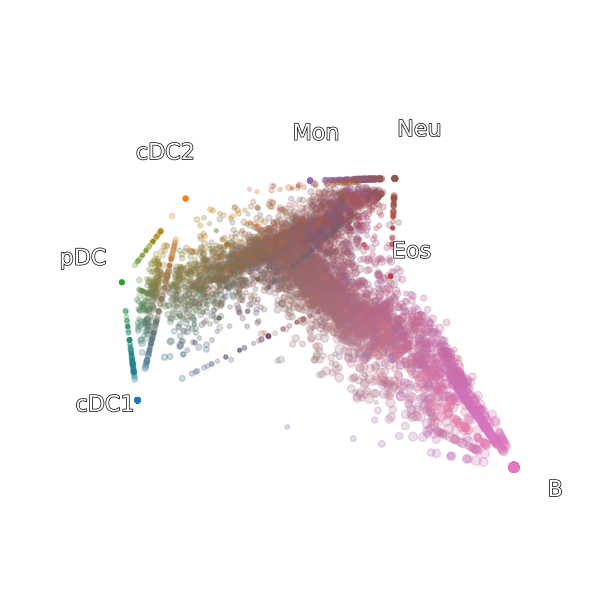

In [88]:
fig = plt.figure(figsize = (7.5, 7.5))
ax = fig.add_subplot(projection = "3d")
ax.scatter(y_pca[:, 0], y_pca[:, 1], y_pca[:, 2], s = 5*np.log1p(adata.obs.sizes), alpha = 0.25, c = adata.obsm["X_colors"], rasterized = True)
for (i, n) in enumerate(fate_names):
    _x, _y, _z = (y_pca[fate_pos_index[i]].mean(0))*1.25
    txt=ax.text(_x, _y, _z, n, size = 16, color = "white",
               path_effects=[pe.withStroke(linewidth=1, foreground="black")])
ax.set_xlim([-0.2, 0.75])
ax.set_ylim([-0.5, 0.5])
ax.set_zlim([-0.75, 0.75])
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")
ax.view_init(elev = 45, azim = 140, roll = 0)
ax.set_box_aspect((1, 1, 1), zoom=1.25)
ax.axis("off")
plt.savefig(f"../figures/simplex_fit.svg")

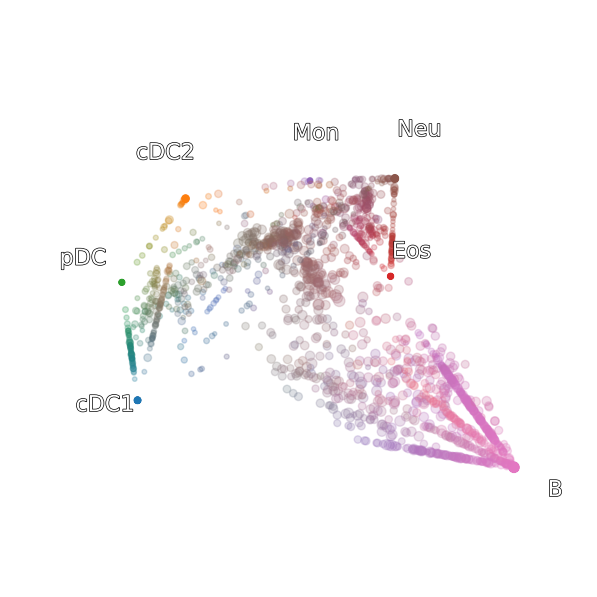

In [89]:
fig = plt.figure(figsize = (7.5, 7.5))
ax = fig.add_subplot(projection = "3d")
ax.scatter(y_exp_pca[:, 0], y_exp_pca[:, 1], y_exp_pca[:, 2], s = 5*np.log1p(adata_exp.obs.sizes), alpha = 0.25, c = adata_exp.obsm["X_colors"], rasterized = True)
for (i, n) in enumerate(fate_names):
    _x, _y, _z = (y_pca[fate_pos_index[i]].mean(0))*1.25
    txt=ax.text(_x, _y, _z, n, size = 16, color = "white",
               path_effects=[pe.withStroke(linewidth=1, foreground="black")])
ax.set_xlim([-0.2, 0.75])
ax.set_ylim([-0.5, 0.5])
ax.set_zlim([-0.75, 0.75])
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")
ax.view_init(elev = 45, azim = 140, roll = 0)
ax.set_box_aspect((1, 1, 1), zoom=1.25)
ax.axis("off")
plt.savefig(f"../figures/simplex_empirical.svg")

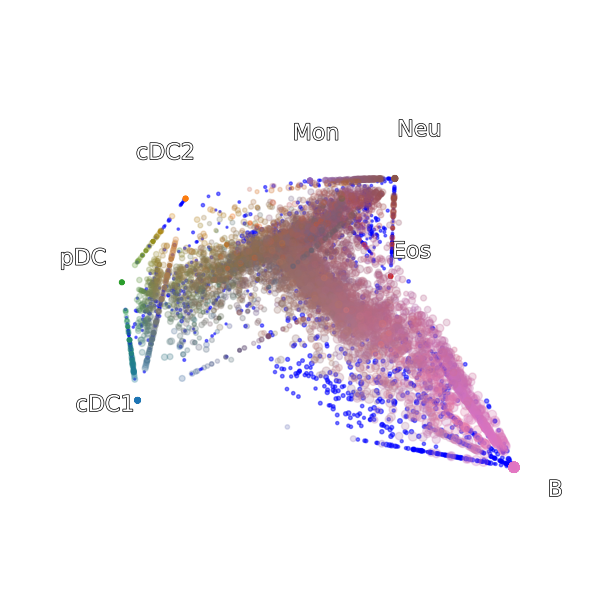

In [90]:
fig = plt.figure(figsize = (7.5, 7.5))
ax = fig.add_subplot(projection = "3d")
ax.scatter(y_pca[:, 0], y_pca[:, 1], y_pca[:, 2], s = 5*np.log1p(adata.obs.sizes), alpha = 0.25, c = adata.obsm["X_colors"], rasterized = True)
ax.scatter(y_exp_pca[:, 0], y_exp_pca[:, 1], y_exp_pca[:, 2], s = 1*np.log1p(adata_exp.obs.sizes), alpha = 0.5, c = "blue", rasterized = True)
for (i, n) in enumerate(fate_names):
    _x, _y, _z = (y_pca[fate_pos_index[i]].mean(0))*1.25
    txt=ax.text(_x, _y, _z, n, size = 16, color = "white",
               path_effects=[pe.withStroke(linewidth=1, foreground="black")])
ax.set_xlim([-0.2, 0.75])
ax.set_ylim([-0.5, 0.5])
ax.set_zlim([-0.75, 0.75])
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")
ax.view_init(elev = 45, azim = 140, roll = 0)
ax.set_box_aspect((1, 1, 1), zoom=1.25)
ax.axis("off")
plt.savefig(f"../figures/simplex_empirical_overlay.svg")

/tmp/ipykernel_49467/2269582941.py:7: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/data/gpfs/projects/punim0638/stephenz/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



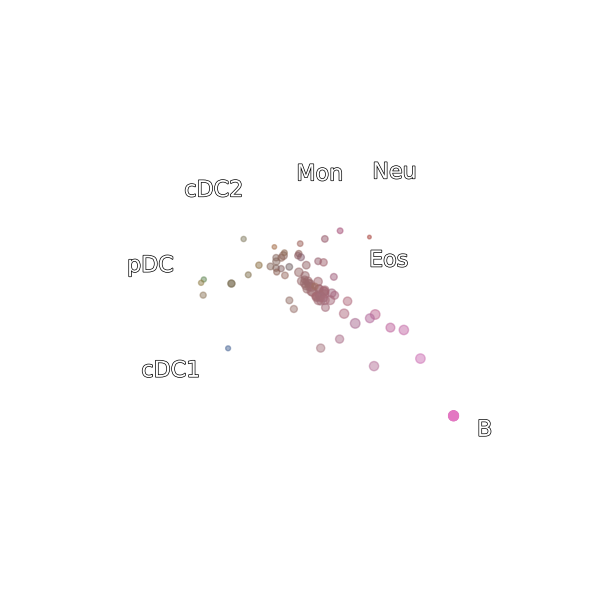

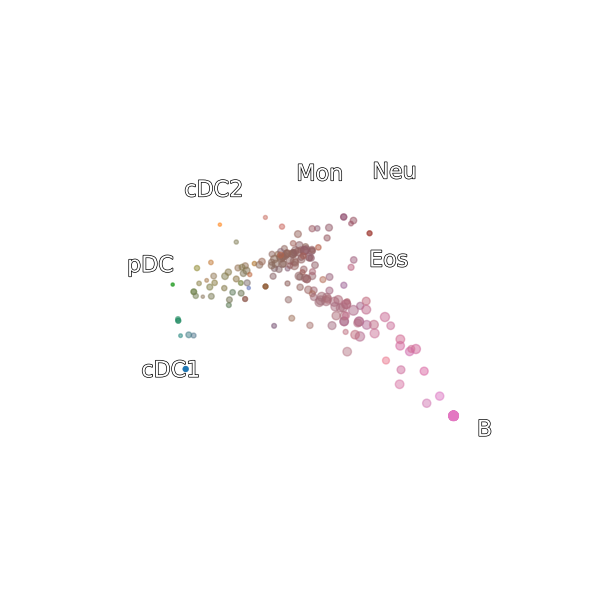

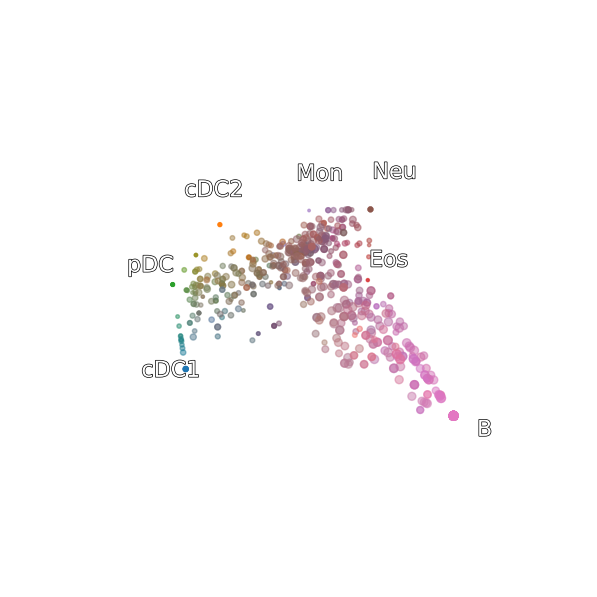

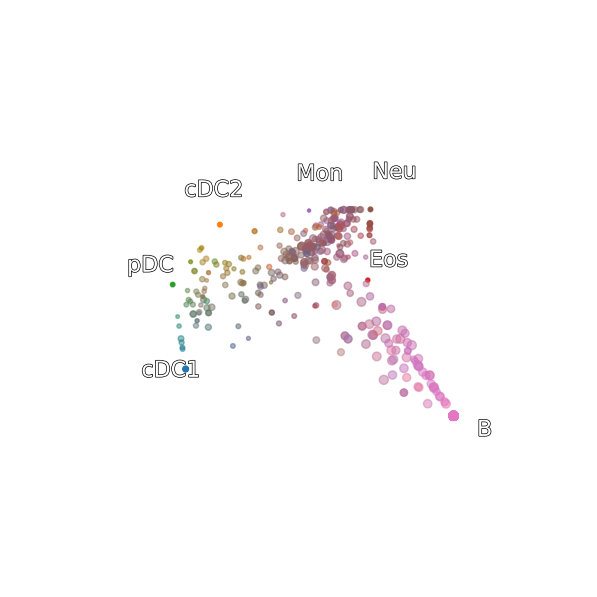

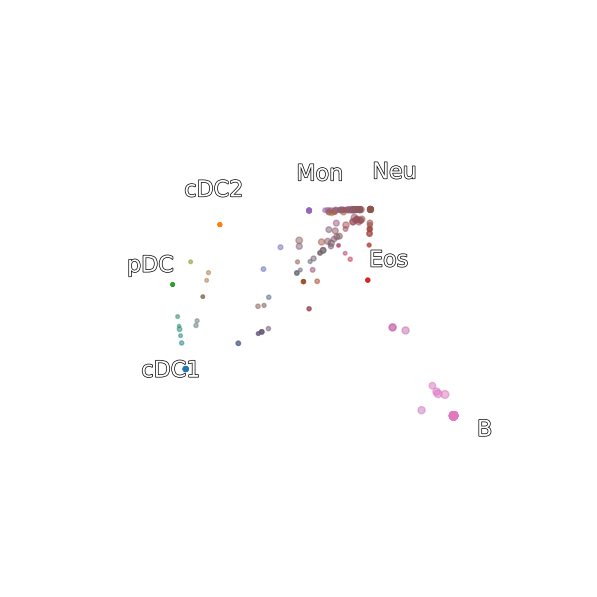

In [91]:
np.random.seed(0)
N_all = [(adata_exp.obs.stage == s).sum() for s in stages]
plot_idx = {s : np.random.choice(np.where(adata.obs.stage == s)[0], N) for (N, s) in zip(N_all, stages)}
for s in stages:
    fig = plt.figure(figsize = (7.5, 7.5))
    ax = fig.add_subplot(projection = "3d")
    ax.scatter(y_pca[plot_idx[s], 0], y_pca[plot_idx[s], 1], y_pca[plot_idx[s], 2], s = 5*np.log1p(adata.obs.sizes[plot_idx[s]]), alpha = 0.5, c = adata[plot_idx[s]].obsm["X_colors"])
    for (i, n) in enumerate(fate_names):
        _x, _y, _z = (y_pca[fate_pos_index[i]].mean(0))*1.25
        txt=ax.text(_x, _y, _z, n, size = 16, color = "white",
                   path_effects=[pe.withStroke(linewidth=1, foreground="black")])
    ax.set_xlim([-0.2, 0.75])
    ax.set_ylim([-0.5, 0.5])
    ax.set_zlim([-0.75, 0.75])
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")
    ax.view_init(elev = 45, azim = 140, roll = 0)
    ax.set_box_aspect((1, 1, 1), zoom=0.9)
    ax.axis("off")
    plt.savefig(f"../figures/simplex_fit_{s}.svg")

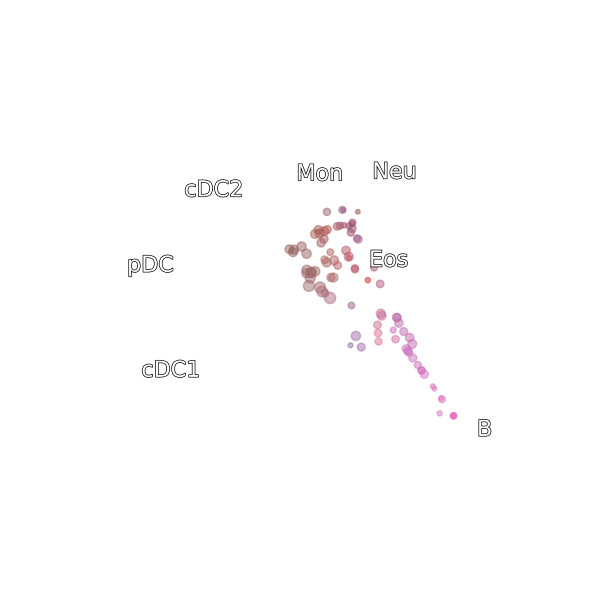

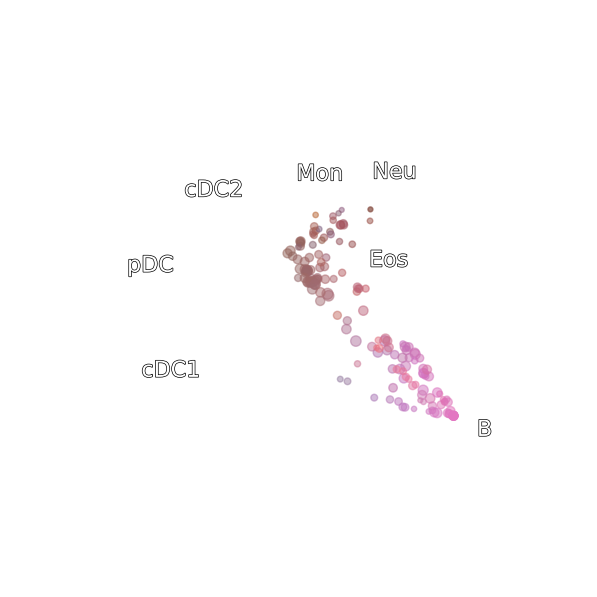

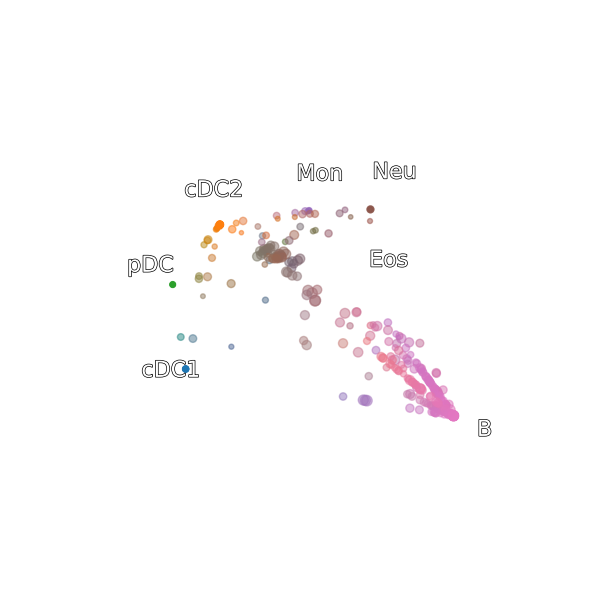

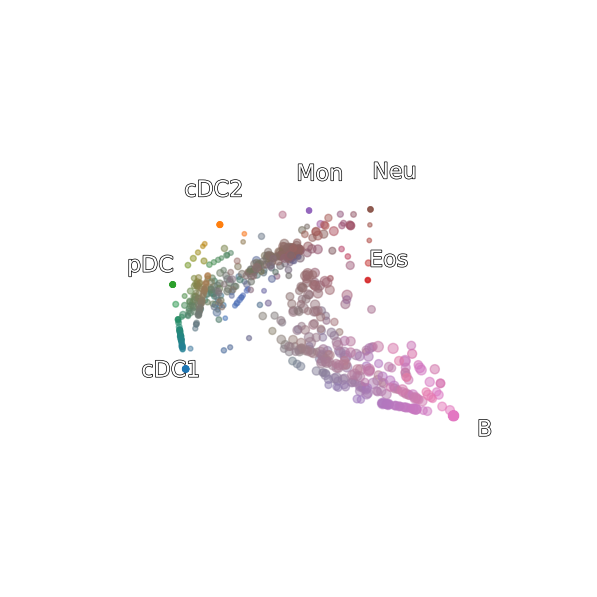

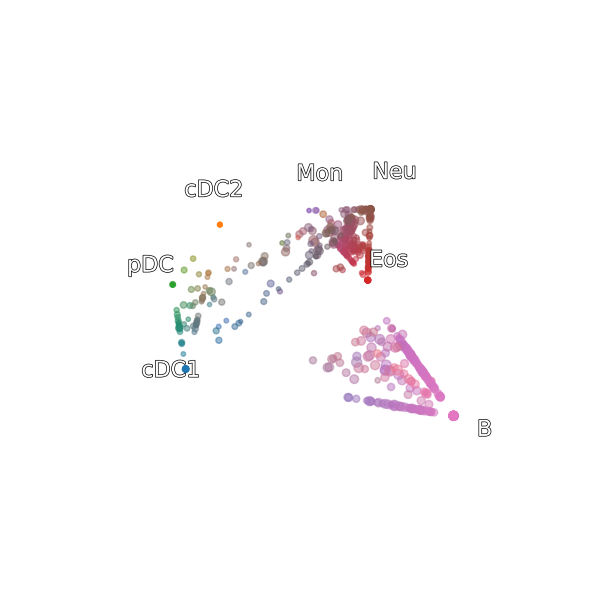

In [92]:
for s in stages:
    fig = plt.figure(figsize = (7.5, 7.5))
    ax = fig.add_subplot(projection = "3d")
    idx = adata_exp.obs.stage == s 
    ax.scatter(y_exp_pca[idx, 0], y_exp_pca[idx, 1], y_exp_pca[idx, 2], s = 5*np.log1p(adata_exp.obs.sizes[idx]), alpha = 0.5, c = adata_exp[idx].obsm["X_colors"])
    for (i, n) in enumerate(fate_names):
        _x, _y, _z = (y_pca[fate_pos_index[i]].mean(0))*1.25
        txt=ax.text(_x, _y, _z, n, size = 16, color = "white",
                   path_effects=[pe.withStroke(linewidth=1, foreground="black")])
    ax.set_xlim([-0.2, 0.75])
    ax.set_ylim([-0.5, 0.5])
    ax.set_zlim([-0.75, 0.75])
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")
    ax.view_init(elev = 45, azim = 140, roll = 0)
    ax.set_box_aspect((1, 1, 1), zoom=0.9)
    ax.axis("off")
    plt.savefig(f"../figures/simplex_empirical_{s}.svg")

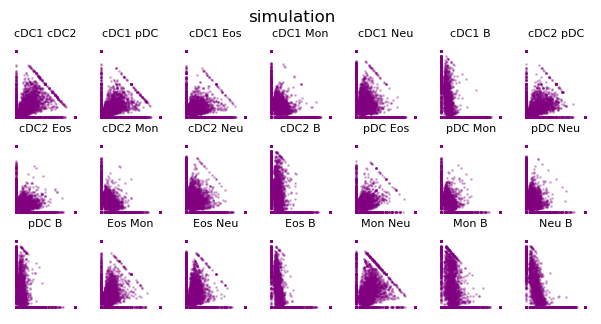

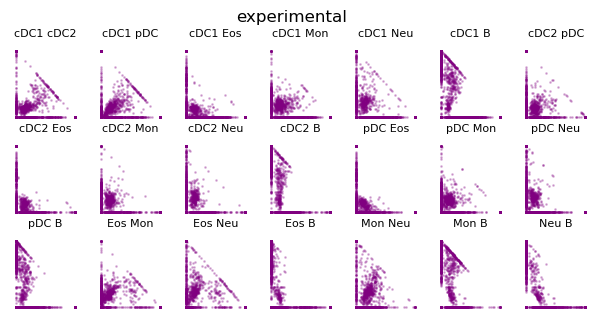

In [106]:
import itertools
for (a, n) in zip([adata, adata_exp], ["simulation", "experimental"]):
    plt.figure(figsize = (7.5, 3.5))
    for idx, (i, j) in enumerate(itertools.combinations(range(len(fate_names)), 2)):
        plt.subplot(3, 7, idx+1)
        plt.scatter(a.obsm["X_norm_log"][:, i], a.obsm["X_norm_log"][:, j], alpha = 0.25, s = 1, c = "purple")
        plt.xlim(-0.1, 1.1); plt.ylim(-0.1, 1.1); plt.axis("off")
        plt.title("%s %s" % (fate_names[i], fate_names[j]), fontsize = 8)
    plt.suptitle(n)
    plt.savefig("../figures/simplex_pairwise.svg")

In [ ]:
fig = plt.figure(figsize = (10, 10))
ax = fig.add_subplot(projection='3d')
ax.set_axis_off()
nframes = 360
pbar = tqdm(total = nframes, position = 0, leave = True)
def init():
    ax.scatter(y_pca[:, 0], y_pca[:, 1], y_pca[:, 2], marker='o', s=10*np.log1p(adata.obs.sizes), c=adata.obsm["X_colors"], alpha=0.1)
    for (i, n) in enumerate(fate_names):
        _x, _y, _z = (y_pca[fate_pos_index[i]].mean(0))*1.25
        txt=ax.text(_x, _y, _z, n, size = 16, color = "white",
                   path_effects=[pe.withStroke(linewidth=4, foreground="grey")])
    # ax.scatter(y_exp_pca[:, 0], y_exp_pca[:, 1], y_exp_pca[:, 2], alpha = 0.05, s = 5, color = "red")
    return fig,
def animate(i):
    ax.view_init(elev=10., azim=i)
    pbar.update(1)
    return fig,
# Animate
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=nframes, interval=20, blit=True)
# Save
# FFwriter = animation.FFMpegFileWriter(fps=30, extra_args=['-vcodec', 'libx264'])
# anim.save('../figures/anim_umap_sim.mp4', writer = FFwriter)
anim.save('../figures/anim_simplex_sim.gif')
pbar.close()

In [ ]:
fig = plt.figure(figsize = (10, 10))
ax = fig.add_subplot(projection='3d')
ax.set_axis_off()
nframes = 360
pbar = tqdm(total = nframes, position = 0, leave = True)
def init():
    ax.scatter(y_exp_pca[:, 0], y_exp_pca[:, 1], y_exp_pca[:, 2], marker='o', s=10*np.log1p(adata_exp.obs.sizes), c=adata_exp.obsm["X_colors"], alpha=0.1)
    for (i, n) in enumerate(fate_names):
        _x, _y, _z = (y_pca[fate_pos_index[i]].mean(0))*1.25
        txt=ax.text(_x, _y, _z, n, size = 16, color = "white",
                   path_effects=[pe.withStroke(linewidth=4, foreground="grey")])
    return fig,
def animate(i):
    ax.view_init(elev=10., azim=i)
    pbar.update(1)
    return fig,
# Animate
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=nframes, interval=20, blit=True)
# Save
# FFwriter = animation.FFMpegFileWriter(fps=30, extra_args=['-vcodec', 'libx264'])
# anim.save('../figures/anim_umap_exp.mp4', writer = FFwriter)
anim.save('../figures/anim_simplex_exp.gif')
pbar.close()

In [120]:
u = np.array([0, 1, -0.1])
u = u/np.linalg.norm(u)
y_pca_1d = np.dot(y_pca, u)
y_traj_pca_1d = np.dot(y_traj_pca, u)
y_cloud_pca_1d = np.dot(y_cloud_pca, u)

In [130]:
fate_text_1d = [y_pca_1d[x].mean() for x in fate_pos_index]
fate_text_1d[4] += 0.025
fate_text_1d[5] -= 0.025

/data/gpfs/projects/punim0638/stephenz/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



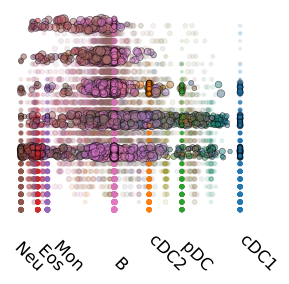

In [145]:
plt.figure(figsize = (3, 3))
plt.scatter(y_cloud_pca_1d, -adata_cloud.obs.t, c = adata_cloud.obsm["X_colors"], s = 5*np.log1p(adata_cloud.obs.sizes), alpha = 0.1, rasterized = True)
# plt.scatter(y_cloud_pca_1d, -adata_cloud.obs.t, c = '#AAAAAA', s = 5*np.log1p(adata_cloud.obs.sizes), alpha = 0.1, rasterized = True)

y_exp_pca_1d = np.dot(y_exp_pca, u)
for (s, t, l) in zip(["1_Early1", "2_Early2", "3_Mid1", "4_Mid2", "5_Late"], [1/30, 6/30, 11/30, 16/30, 21/30], 
                     ["LT112", "LT56, ST56", "ST28, MPP28", "MPP14", "ProDC9, CMP9, CLP14, CLP28"]):
    idx = np.where(adata_exp.obs.stage == s)[0]
    # for width_factor in [1, 2, 5, 10,]:
    for width_factor in [1, ]:
        plt.scatter(y_exp_pca_1d[idx], 
                    -adata_cloud.obs.t.max()*np.repeat(t, len(idx)) + (np.random.rand(len(idx)) - 1/2)*1.5, 
                    c = adata_exp[idx].obsm['X_colors'], s = 5*width_factor*np.log1p(adata_exp[idx].obs.sizes), 
                    alpha = 0.5, marker = "o", rasterized = False, edgecolor = 'k', linewidths = 0.5)
#     plt.text(y_exp_pca_1d.max() + 0.05, -adata_cloud.obs.t.max()*t, l)
plt.gca().set_axis_off()
# plt.xlim(-0.5, 1.25)
for (i, n) in enumerate(fate_names):
    # _x = y_pca_1d[fate_pos_index[i]].mean()
    _x = fate_text_1d[i]
    plt.text(_x - 0.01, -np.max(adata_cloud.obs.t) - 8, n, fontsize = 12, path_effects=[pe.withStroke(linewidth=4, foreground="white")], rotation = -45)
plt.tight_layout()
plt.savefig("../figures/fate_vs_time_jitter.pdf", dpi = 300)

/tmp/ipykernel_49467/2640348439.py:8: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.



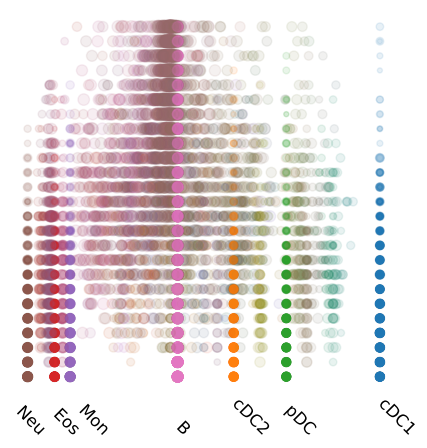

In [161]:
plt.figure(figsize = (5, 5))
plt.scatter(y_cloud_pca_1d, -adata_cloud.obs.t, c = adata_cloud.obsm["X_colors"], s = 25*np.log1p(adata_cloud.obs.sizes), alpha = 0.1, rasterized = True)
plt.gca().set_axis_off()
for (i, n) in enumerate(fate_names):
    # _x = y_pca_1d[fate_pos_index[i]].mean()
    _x = fate_text_1d[i]
    plt.text(_x - 0.01, -np.max(adata_cloud.obs.t) - 4, n, fontsize = 12, path_effects=[pe.withStroke(linewidth=4, foreground="white")], rotation = -45)
plt.tight_layout()
plt.savefig("../figures/simplex_1d_color.pdf", dpi = 300 )

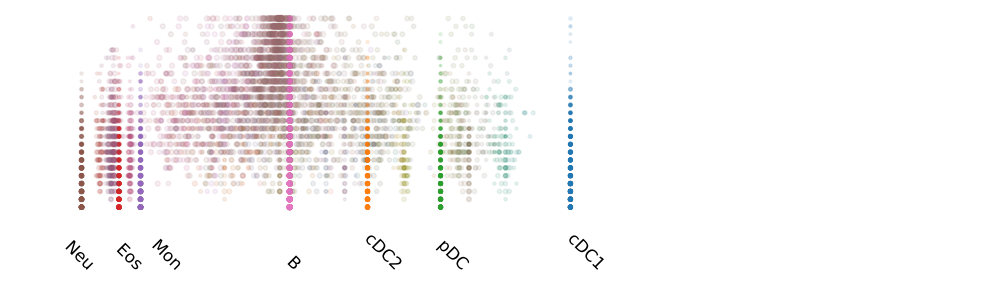

In [146]:
plt.figure(figsize = (10, 3))
plt.scatter(y_cloud_pca_1d, -adata_cloud.obs.t, c = adata_cloud.obsm["X_colors"], s = 5*np.log1p(adata_cloud.obs.sizes), alpha = 0.1, rasterized = True)
plt.gca().set_axis_off()
plt.xlim(-0.5, 1.25)
for (i, n) in enumerate(fate_names):
    # _x = y_pca_1d[fate_pos_index[i]].mean()
    _x = fate_text_1d[i]
    plt.text(_x - 0.01, -np.max(adata_cloud.obs.t) - 8, n, fontsize = 12, path_effects=[pe.withStroke(linewidth=4, foreground="white")], rotation = -45)
plt.tight_layout()
plt.savefig("../figures/fate_vs_time_sim_color.pdf")

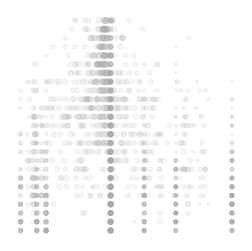

In [135]:
subsample_idx = adata_cloud.obs.id.isin(range(5));
plt.figure(figsize = (3, 3))
plt.scatter(y_cloud_pca_1d[subsample_idx], -adata_cloud.obs.t[subsample_idx], c = '#AAAAAA', s = 5*np.log1p(adata_cloud.obs.sizes[subsample_idx]), alpha = 0.1, rasterized = True)
plt.gca().set_axis_off()

/data/gpfs/projects/punim0638/stephenz/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/data/gpfs/projects/punim0638/stephenz/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/data/gpfs/projects/punim0638/stephenz/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/data/gpfs/projects/punim0638/stephenz/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1113: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) inste

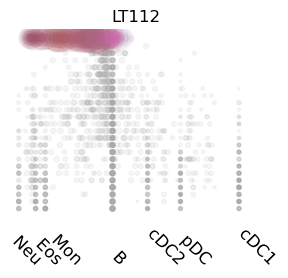

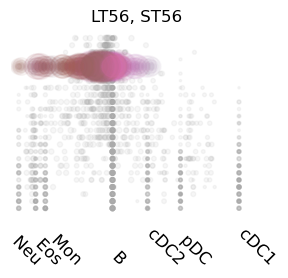

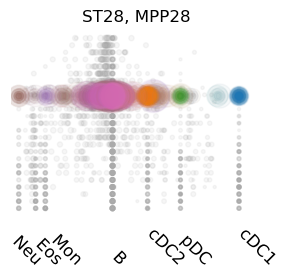

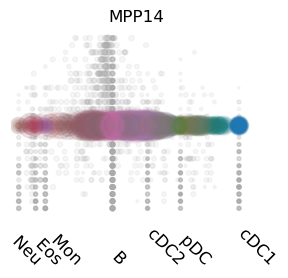

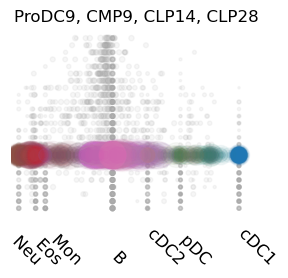

In [136]:
for (s, t, l) in zip(["1_Early1", "2_Early2", "3_Mid1", "4_Mid2", "5_Late"], [1/30, 6/30, 11/30, 16/30, 21/30], 
                     ["LT112", "LT56, ST56", "ST28, MPP28", "MPP14", "ProDC9, CMP9, CLP14, CLP28"]):
    plt.figure(figsize = (3, 3))
    # plt.scatter(y_cloud_pca_1d, -adata_cloud.obs.t, c = adata_cloud.obsm["X_colors"], s = 5*np.log1p(adata_cloud.obs.sizes), alpha = 0.01, rasterized = True)
    plt.scatter(y_cloud_pca_1d[subsample_idx], -adata_cloud.obs.t[subsample_idx], c = '#AAAAAA', s = 5*np.log1p(adata_cloud.obs.sizes[subsample_idx]), alpha = 0.1, rasterized = True)
    y_exp_pca_1d = np.dot(y_exp_pca, u)
    idx = np.where(adata_exp.obs.stage == s)[0]
    for width_factor in [1, 2, 5, 10]:
        plt.scatter(y_exp_pca_1d[idx], 
                    -adata_cloud.obs.t.max()*np.repeat(t, len(idx)) + np.random.randn(len(idx))*0., 
                    c = adata_exp[idx].obsm['X_colors'], s = 5*width_factor*np.log1p(adata_exp[idx].obs.sizes), alpha = 0.05, marker = "o", rasterized = True)
    # plt.text(y_exp_pca_1d.max() + 0.05, -adata_cloud.obs.t.max()*t, l)
    plt.title(l)
    plt.gca().set_axis_off()
    plt.xlim(-0.4, 0.6)
    for (i, n) in enumerate(fate_names):
        # _x = y_pca_1d[fate_pos_index[i]].mean()
        _x = fate_text_1d[i]
        plt.text(_x - 0.01, -np.max(adata_cloud.obs.t) - 8, n, fontsize = 12, path_effects=[pe.withStroke(linewidth=4, foreground="white")], rotation = -45)
    plt.tight_layout()
    plt.savefig(f"../figures/fate_vs_time_{s}_jitter.pdf", dpi = 300)

In [137]:
# y_traj_pca_1d = np.dot(y_traj_pca, u)
# # show clonal trajectories
# for j in [15, ]: # adata_traj.obs.id.unique():
#     plt.figure(figsize = (5, 3))
#     plt.scatter(y_traj_pca_1d, 1-adata_traj.obs.t, color = "grey", alpha = 0.1, s = SIZE_FACTOR*np.log1p(adata_traj.obs.sizes), rasterized = True)
#     idx = (adata_traj.obs.id == j)
#     plt.scatter(y_traj_pca_1d[idx], 1-adata_traj.obs.t[idx], c = adata_traj.obsm["X_colors"][idx], alpha = 0.75, s = SIZE_FACTOR*np.log1p(adata_traj[idx].obs.sizes), rasterized = True)
#     plt.title("Clone %d" % j)
#     for (i, n) in enumerate(fate_names):
#         _x = y_pca_1d[fate_pos_index[i]].mean()
#         plt.text(_x - 0.01, -np.max(adata_traj.obs.t) - 8, n, fontsize = 12, path_effects=[pe.withStroke(linewidth=4, foreground="white")], rotation = -45)
#     plt.axis("off")
#     plt.tight_layout()
#     plt.savefig(f"../figures/clone_traj_{j}.pdf", dpi = 300)

In [138]:
# nframes = 120
# nframes = 20
# frame_time = np.floor(np.linspace(1, adata_traj.obs.t.max()+1, nframes))
# 
# for _id in adata_traj.obs.id.unique():
#     y_traj_pca_1d = np.dot(y_traj_pca, u)
#     idx = (adata_traj.obs.id == _id)
#     fig = plt.figure(figsize = (10, 10))
#     ax = fig.add_subplot(projection='3d')
#     ax.set_axis_off()
#     pbar = tqdm(total = nframes, position = 0, leave = True)
#     ax.scatter(y_traj_pca_1d, -adata_traj.obs.t, np.zeros(y_traj_pca_1d.shape[0]), marker='o', s=25*np.log1p(adata_traj.X.sum(-1)), c="grey", alpha=0.05)
#     t_weight = np.zeros(adata_traj[idx].shape[0])
#     plt_scatter = ax.scatter(y_traj_pca_1d[idx], 1-adata_traj.obs.t[idx], np.zeros(y_traj_pca_1d[idx].shape[0]), marker='o', s=0, c=adata_traj.obsm["X_colors"][idx, :], alpha=0.5)
#     for (i, n) in enumerate(fate_names):
#         _x = y_pca_1d[fate_pos_index[i]].mean()
#         ax.text(_x, -np.max(adata_traj.obs.t) - 4, 0, n, 'y', fontsize = 16, path_effects=[pe.withStroke(linewidth=4, foreground="white")], rotation = -45)
#     def init():
#         ax.view_init(elev=90., azim=-90)
#         return fig,
#     def animate(i):
#         global t_weight
#         t_weight += np.exp(-(adata_traj[idx].obs.t - frame_time[i])**2 / 5)
#         plt_scatter.set_sizes(25*np.maximum(0, t_weight-0.05)*np.log1p(adata_traj[idx, :].X.sum(-1)))
#         pbar.update(1)
#         return fig,
#     anim = animation.FuncAnimation(fig, animate, init_func=init,
#                                    frames=nframes, interval=20, blit=True)
#     # anim.save('../figures/clone_%d.gif' % _id)
#     anim.save('../figures/clone_%d_fast.gif' % _id)
#     pbar.close()

In [139]:
# fig = plt.figure(figsize = (10, 10))
# ax = fig.add_subplot(projection='3d')
# ax.set_axis_off()
# ax.scatter(y_traj_pca_1d, -adata_traj.obs.t, np.zeros(y_traj_pca_1d.shape[0]), marker='o', s=25*np.log1p(adata_traj.X.sum(-1)), c=adata_traj.obsm["X_colors"], alpha=0.25)
# for (i, n) in enumerate(fate_names):
#     _x = y_pca_1d[fate_pos_index[i]].mean()
#     ax.text(_x, -np.max(adata_traj.obs.t) - 4, 0, n, 'y', fontsize = 16, path_effects=[pe.withStroke(linewidth=4, foreground="white")], rotation = -45)
# ax.view_init(elev=90., azim=-90)
# plt.savefig("../figures/clone_trajectories_background.png")

/tmp/ipykernel_49467/4226951049.py:5: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



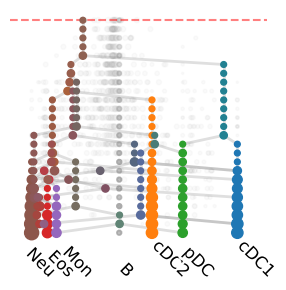

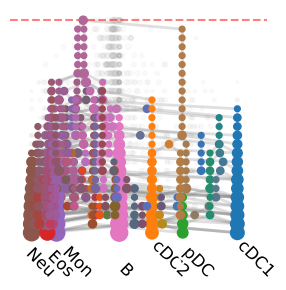

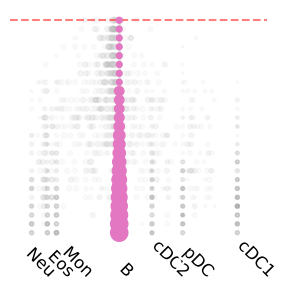

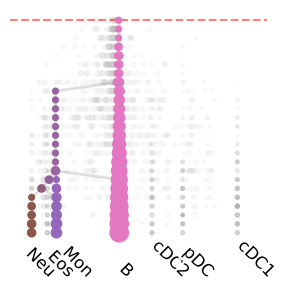

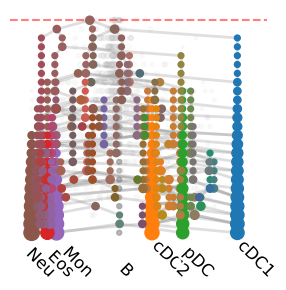

...

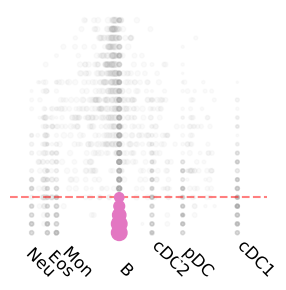

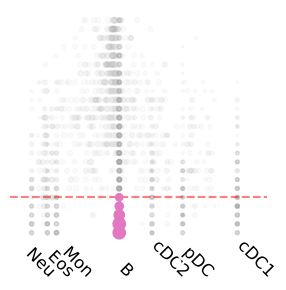

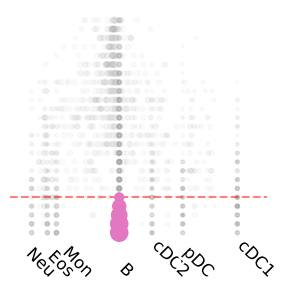

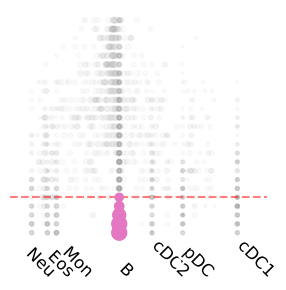

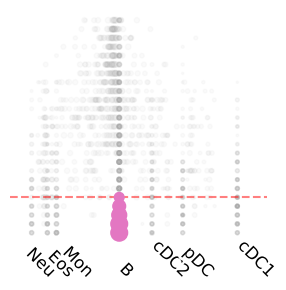

In [140]:
from matplotlib.collections import LineCollection
from collections import Counter
for s in stages:
    for j in range(0, 9):
        plt.figure(figsize = (3, 3))
        df_tree = pd.read_csv(f"../data/tree_stage_{s}_{j}.csv")
        start_idx = df_tree.columns.str.contains("start")
        end_idx = df_tree.columns.str.contains("end")
        # set up coordinates
        y_tree_start = df_tree.loc[:, start_idx].to_numpy() @ v
        y_tree_start_pca = pca_op.transform(y_tree_start)
        y_tree_start_pca_1d = np.dot(y_tree_start_pca, u)
        y_tree_end = df_tree.loc[:, end_idx].to_numpy() @ v
        y_tree_end_pca = pca_op.transform(y_tree_end)
        y_tree_end_pca_1d = np.dot(y_tree_end_pca, u)
        # plotting
        lines = []
        dots = Counter([])
        c = {}
        for i in range(df_tree.shape[0]):
            lines.append([(y_tree_start_pca_1d[i], df_tree.loc[i, "t0"]), (y_tree_end_pca_1d[i], df_tree.loc[i, "t1"])])
            p0, p1 = (y_tree_start_pca_1d[i], df_tree.loc[i, "t0"]), (y_tree_end_pca_1d[i], df_tree.loc[i, "t1"])
            c[p0] = np.minimum(df_tree.iloc[i, start_idx].to_numpy() @ colors, 1)
            c[p1] = np.minimum(df_tree.iloc[i, end_idx].to_numpy() @ colors, 1)
            if df_tree.t0[i] == df_tree.t0.max():
                dots.update([p0, p1, ])
            else:
                dots.update([p0, ])
        lc = LineCollection(lines, linewidth = 2, alpha = 0.25, color = 'grey')
        plt.gca().add_collection(lc)
        _x, _y, _n, _c = list(itertools.starmap(lambda x, _: x, dots)),\
                     list(itertools.starmap(lambda _, x: x, dots)),\
                     [dots[i] for i in dots],\
                     [c[i] for i in dots]
        offset = np.max(_y) - adata_cloud.obs.t[subsample_idx].max() 
        plt.scatter(y_cloud_pca_1d[subsample_idx], adata_cloud.obs.t[subsample_idx]+offset, c = '#AAAAAA', s = 5*np.log1p(adata_cloud.obs.sizes[subsample_idx]), alpha = 0.05, rasterized = True)
        plt.hlines(0, 1.25*y_pca_1d.min(), 1.25*y_pca_1d.max(), color = 'r', linestyle = 'dashed', alpha = 0.5)
        plt.scatter(_x, _y, s = 25*np.log1p(_n), c = _c, zorder = 10)
        plt.gca().invert_yaxis()
        for (i, n) in enumerate(fate_names):
            # _x = y_pca_1d[fate_pos_index[i]].mean()
            _x = fate_text_1d[i]
            plt.text(_x - 0.01, np.max(df_tree.t1) + 5, n, fontsize = 12, path_effects=[pe.withStroke(linewidth=4, foreground="white")], rotation = -45)
        plt.axis("off")
        plt.xlim(1.25*y_pca_1d.min(), 1.25*y_pca_1d.max())
        plt.tight_layout()
        plt.savefig(f"../figures/clone_tree_{s}_{j}.pdf", dpi = 300, transparent = True)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [00:02<00:00, 14.55it/s]
/tmp/ipykernel_49467/1412497795.py:5: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [00:01<00:00, 20.83it/s]


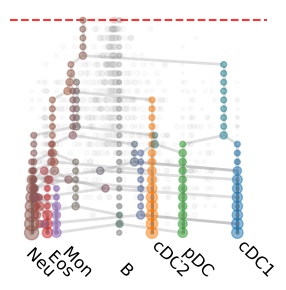

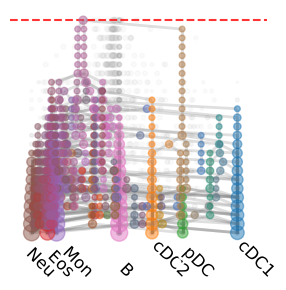

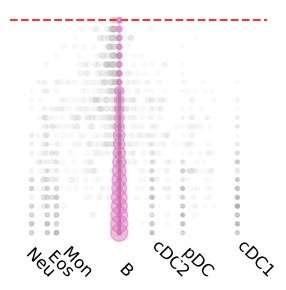

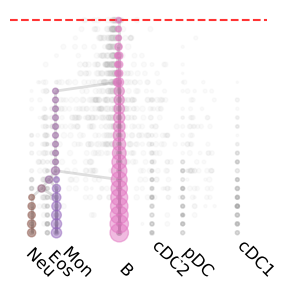

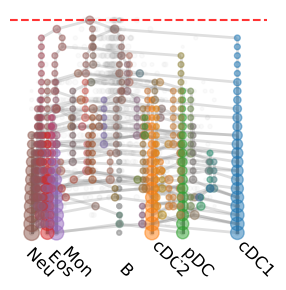

...

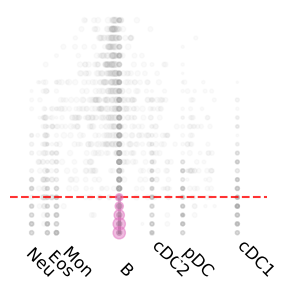

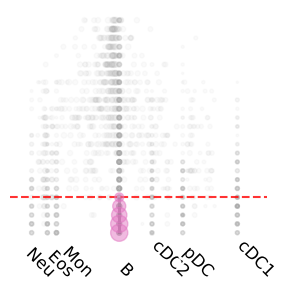

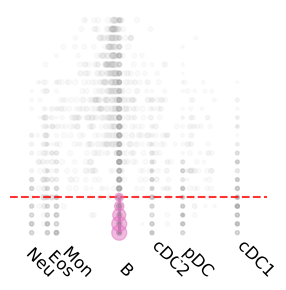

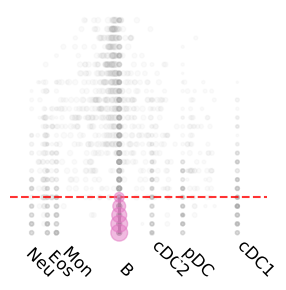

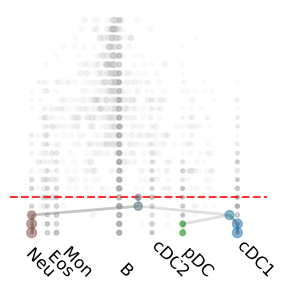

In [141]:
nframes = 30

for s in stages:
    for j in range(0, 10):
        fig = plt.figure(figsize = (3, 3))
        ax = fig.add_subplot()
        df_tree = pd.read_csv(f"../data/tree_stage_{s}_{j}.csv")
        start_idx = df_tree.columns.str.contains("start")
        end_idx = df_tree.columns.str.contains("end")
        # set up coordinates
        y_tree_start = df_tree.loc[:, start_idx].to_numpy() @ v
        y_tree_start_pca = pca_op.transform(y_tree_start)
        y_tree_start_pca_1d = np.dot(y_tree_start_pca, u)
        y_tree_end = df_tree.loc[:, end_idx].to_numpy() @ v
        y_tree_end_pca = pca_op.transform(y_tree_end)
        y_tree_end_pca_1d = np.dot(y_tree_end_pca, u)
        # plotting
        lines = []
        dots = Counter([])
        c = {}
        for i in range(df_tree.shape[0]):
            lines.append([(y_tree_start_pca_1d[i], df_tree.loc[i, "t0"]), (y_tree_end_pca_1d[i], df_tree.loc[i, "t1"])])
            p0, p1 = (y_tree_start_pca_1d[i], df_tree.loc[i, "t0"]), (y_tree_end_pca_1d[i], df_tree.loc[i, "t1"])
            c[p0] = np.minimum(df_tree.iloc[i, start_idx].to_numpy() @ colors, 1)
            c[p1] = np.minimum(df_tree.iloc[i, end_idx].to_numpy() @ colors, 1)
            if df_tree.t0[i] == df_tree.t0.max():
                dots.update([p0, p1, ])
            else:
                dots.update([p0, ])
        lc = LineCollection(lines, linewidth = 2, alpha = 0.25, color = 'grey')
        plt.gca().add_collection(lc)
        _x, _y, _n, _c = list(itertools.starmap(lambda x, _: x, dots)),\
                     list(itertools.starmap(lambda _, x: x, dots)),\
                     [dots[i] for i in dots],\
                     [c[i] for i in dots]
        frame_time = np.floor(np.linspace(1, np.max(_y)+1, nframes))
        offset = np.max(_y) - adata_cloud.obs.t[subsample_idx].max() 
        plt.scatter(y_cloud_pca_1d[subsample_idx], adata_cloud.obs.t[subsample_idx]+offset, c = '#AAAAAA', s = 5*np.log1p(adata_cloud.obs.sizes[subsample_idx]), alpha = 0.05, rasterized = True)
        ### plotting starts here
        t_weight = np.zeros(len(_x))
        plt.hlines(0, 1.25*y_pca_1d.min(), 1.25*y_pca_1d.max(), color = 'r', linestyle = 'dashed', alpha = 0.8)
        plt_scatter = plt.scatter(_x, _y, s = 0, c = _c, zorder = 10, alpha = 0.5)
        ### 
        plt.gca().invert_yaxis()
        for (i, n) in enumerate(fate_names):
            # x_ = y_pca_1d[fate_pos_index[i]].mean()
            x_ = fate_text_1d[i]
            plt.text(x_ - 0.01, np.max(df_tree.t1) + 5, n, fontsize = 12, path_effects=[pe.withStroke(linewidth=4, foreground="white")], rotation = -45)
        plt.axis("off")
        plt.xlim(1.25*y_pca_1d.min(), 1.25*y_pca_1d.max())
        plt.tight_layout()
        pbar = tqdm(total = nframes, position = 0, leave = True)
        # plotting 
        def init():
            return fig,
        def animate(i):
            global t_weight
            f = lambda x: np.exp(-x**2)
            t_weight += f((_y - frame_time[i]) / 2.5)
            plt_scatter.set_sizes(25*np.minimum(1, np.maximum(t_weight - 0.05, 0))*np.log1p(_n))
            pbar.update(1)
            return fig,
        anim = animation.FuncAnimation(fig, animate, init_func=init,
                                       frames=nframes, interval=20, blit=True)
        anim.save(f"../figures/clone_tree_{s}_{j}.gif")
        pbar.close()

In [142]:
import glob
files = np.sort(glob.glob("../data/clone_readout_all_*.csv"))
adata_all = [ad.AnnData(pd.read_csv(f)) for f in files]

for a in adata_all:
    a.obsm["X_norm"] = (a.X.T / a.X.sum(1)).T
    a.obs["sizes"] = a.X.sum(-1)
    sc.pp.log1p(a)
    a.obs["sizes_log"] = a.X.sum(-1)
    a.obsm["X_norm_log"] = (a.X.T / a.X.sum(1)).T
    # entropy relative to uniform
    a.obs["ent"] = ent(a.obsm["X_norm_log"], np.ones(a.shape[1]))
    # log colors
    a.obsm["X_color_fraction"] = a.obsm["X_norm_log"]
    colors = np.array([np.array(cm(x)) for x in range(a.shape[1])])
    a.obsm["X_colors"] = a.obsm["X_color_fraction"] @ colors
    a.obsm["X_colors"] /= np.max(a.obsm["X_colors"], -1).reshape(-1, 1)
    sc.pp.pca(a)

y_all = [a.obsm["X_norm_log"] @ v for a in adata_all]
# fit PCA operator again 
y = adata.obsm["X_norm_log"] @ v
pca_op = sk.decomposition.PCA(n_components = 3).fit(y)
# 
y_pca_all = [pca_op.transform(y) for y in y_all]

/data/gpfs/projects/punim0638/stephenz/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning:

Transforming to str index.

/data/gpfs/projects/punim0638/stephenz/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning:

Transforming to str index.

/data/gpfs/projects/punim0638/stephenz/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning:

Transforming to str index.

/data/gpfs/projects/punim0638/stephenz/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning:

Transforming to str index.

/data/gpfs/projects/punim0638/stephenz/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning:

Transforming to str index.



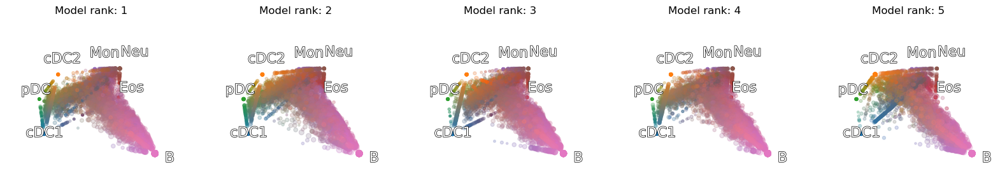

In [143]:
fig = plt.figure(figsize = (20, 7.5))
for (i, (_y_pca, _adata)) in enumerate(zip(y_pca_all, adata_all)):
    ax = fig.add_subplot(1, 5, i+1, projection = "3d")
    ax.scatter(_y_pca[:, 0], _y_pca[:, 1], _y_pca[:, 2], s = 5*np.log1p(_adata.obs.sizes), alpha = 0.25, c = _adata.obsm["X_colors"], rasterized = True)
    plt.title(f"Model rank: {i+1}")
    for (i, n) in enumerate(fate_names):
        _x, _y, _z = (y_pca[fate_pos_index[i]].mean(0))*1.25
        txt=ax.text(_x, _y, _z, n, size = 16, color = "white",
                   path_effects=[pe.withStroke(linewidth=1, foreground="black")])
    ax.set_xlim([-0.2, 0.75])
    ax.set_ylim([-0.5, 0.5])
    ax.set_zlim([-0.75, 0.75])
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")
    ax.view_init(elev = 45, azim = 140, roll = 0)
    ax.set_box_aspect((1, 1, 1), zoom=1.25)
    ax.axis("off")